In [136]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import pandas as pd
import numpy as np
import random
import cv2
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
from matplotlib.pyplot import Rectangle

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Setup

In [ ]:
# Untar files into data directory
# tar zxvf bbox_images.tar.gz
DATA_DIR = '/bigguy/data/volleyball/'
IMG_DIR = os.path.join(DATA_DIR, 'images_subset')

In [ ]:
# Remove 4 bad files
%rm {DATA_DIR}._* 

In [ ]:
metadata_fpath = os.path.join(IMG_DIR, 'bbox_labels.csv')
metadata = pd.read_csv(metadata_fpath)
metadata['label_name'] = 'ball'
metadata['label_id'] = 1
fnames = metadata['filename']
fpaths = [os.path.join(IMG_DIR, f) for f in fnames]
metadata['fpath'] = fpaths

### Helpers

In [154]:
def plot_img(arr, fs=(6,6), title=None):
    plt.figure(figsize=fs)
    plt.imshow(arr)
    plt.title(title)
    plt.show()
    
def load_img(fpath):
    #img = cv2.imread(img_fpath)
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return plt.imread(fpath)

def load_resize_img(fpath, w, h):
    img = cv2.imread(img_fpath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (w, h), interpolation=cv2.INTER_CUBIC)
    return img

### Explore

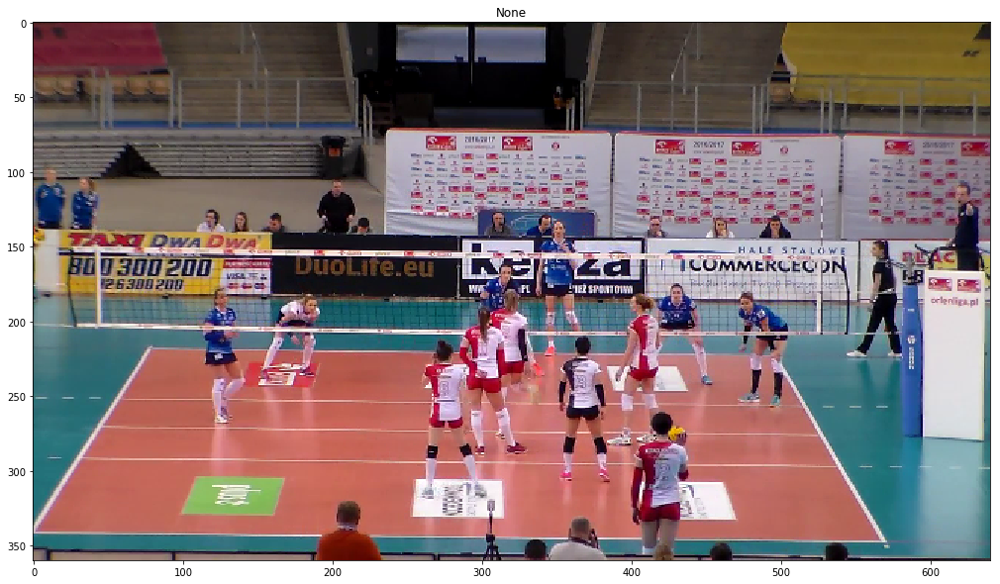

In [162]:
img = load_resize_img(img_fpath, 640, 360)
plot_img(img, fs=(20,10))

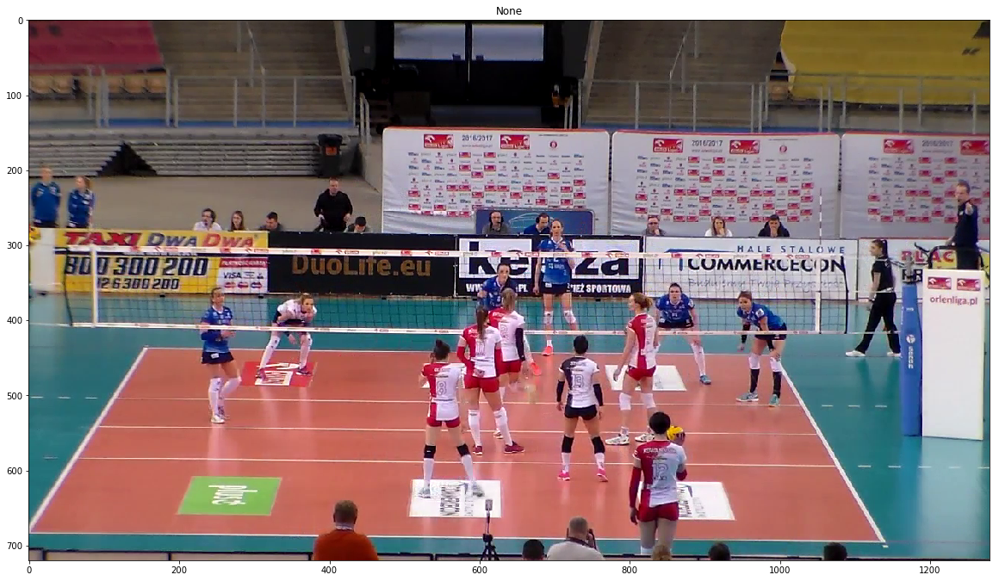

In [156]:
img_fpath = fpaths[random.randint(0,len(fpaths)-1)]
img = load_img(img_fpath)
plot_img(img, fs=(20,18))

In [ ]:
# Animation
# http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-notebooks/
# https://github.com/bilylee/videofig/blob/master/videofig.py
# https://matplotlib.org/users/image_tutorial.html

# First set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()

ax.set_xlim(( 0, 2))
ax.set_ylim((-2, 2))

line, = ax.plot([], [], lw=2)

In [ ]:
# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return (line,)

# animation function. This is called sequentially
def animate(i):
    x = np.linspace(0, 2, 1000)
    y = np.sin(2 * np.pi * (x - 0.01 * i))
    line.set_data(x, y)
    return (line,)

In [ ]:
# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, blit=True)

In [ ]:
HTML(anim.to_html5_video())

In [ ]:
# MY ANIMATION WITH IMAGES

In [ ]:
img = plt.imread(fpaths[0])
plt.imshow(img)

In [ ]:
# First set up the figure, the axis, and the plot element we want to animate
img = plt.imread(fpaths[0])
imgplot = plt.imshow(img)

In [ ]:
ax1 = plt.subplot()
ax1.set_title("hey", size=20)
ax1.figure.set_figwidth(14)
ax1.figure.set_figheight(8)
ax1.imshow(img)

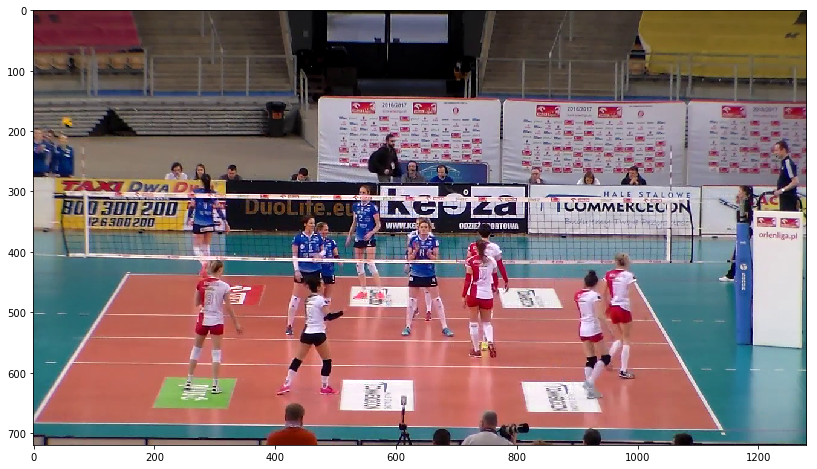

In [114]:
ax = plt.subplot()
ax.figure.set_figwidth(14)
ax.figure.set_figheight(8)

img = plt.imread(fpaths[0])
imgplot = ax.imshow(img)

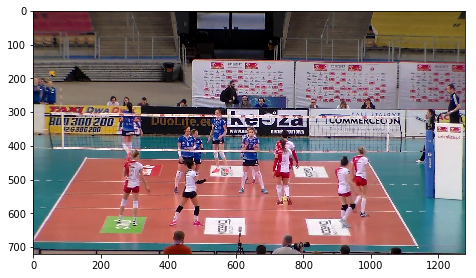

In [ ]:
imgs = []

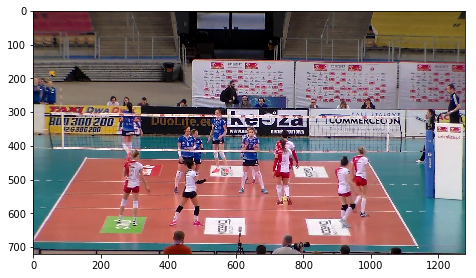

In [165]:
# Got it working!
fig = plt.figure()
axes = plt.axes([0, 0.03, 1, 0.97])

img = plt.imread(fpaths[0])
imgplot = axes.imshow(img, animated=True)

In [166]:
# initialization function: plot the background of each frame
def init():
    return (imgplot,)

# animation function. This is called sequentially
def animate(fpath):
    img = plt.imread(fpath)
    imgplot.set_array(img)
    return (imgplot,)

In [167]:
# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=fpaths, interval=20, blit=True)

In [168]:
HTML(anim.to_html5_video())

### Mask RCNN

In [173]:
def make_boxes(meta):
    boxes = {}
    for idx,row in meta.iterrows():
        box = json.loads(row.to_json())
        fname = row['filename']
        if fname in boxes:
            boxes[fname].append(box)
        else:
            boxes[fname] = [box]
    return boxes

In [177]:
fname = metadata['filename'][0]
fpath = metadata['fpath'][0]
GT_BOXES = make_boxes(metadata)
boxes = GT_BOXES[fname]
print(boxes)

[{'filename': 'volleyball_frame_00665.png', 'x1': 45.5, 'x2': 64.5, 'y1': 175.0, 'y2': 195.0, 'label_name': 'ball', 'label_id': 1, 'fpath': '/bigguy/data/volleyball/images_subset/volleyball_frame_00665.png'}]


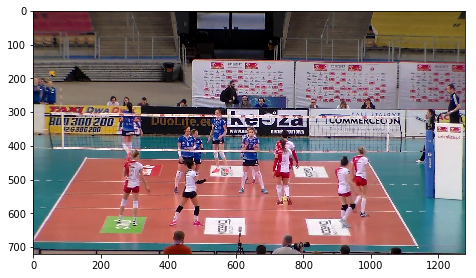

In [184]:
# Got it working!
fig = plt.figure()
axes = plt.axes([0, 0.03, 1, 0.97])

img = plt.imread(fpaths[0])
imgplot = axes.imshow(img, animated=True)

In [189]:
all_boxes = GT_BOXES
# initialization function: plot the background of each frame
def init():
    return (imgplot,)

def animate_w_box(fname):
    fpath = os.path.join(IMG_DIR, fname)
    img = plt.imread(fpath)
    imgplot.set_array(img)
    
    # Remove old boxes
    for p in axes.patches:
        p.remove()
    boxes = all_boxes[fname]
    for box in boxes:
        width = box['x2'] - box['x1']
        height = box['y2'] - box['y1']
        bb = Rectangle(
            (box['x1'],box['y1']), 
            width, height,
            fill=False,
            edgecolor="red")
        axes.add_patch(bb)    
    return (imgplot,)

In [190]:
# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate_w_box, init_func=init,
                               frames=fnames, interval=20, blit=True)

In [191]:
HTML(anim.to_html5_video())

### Links

* https://towardsdatascience.com/how-to-train-your-own-object-detector-with-tensorflows-object-detector-api-bec72ecfe1d9
* https://github.com/christopher5106/FastAnnotationTool
* http://androidkt.com/train-object-detection/
* https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/using_your_own_dataset.md
* https://towardsdatascience.com/building-a-real-time-object-recognition-app-with-tensorflow-and-opencv-b7a2b4ebdc32